# Question 1
#### 1.1)
Size of image = 5.76 MB = 5760000 Bytes = $\frac{5760000}{8}$ total pixels of R+G+B = 720000 
In each plane there will be $\frac{720000}{3}$ = 240000 pixels and it will be equal to the $h*w$ of the image      
The ratio of the height and width is 4:3. Hence we can write this relation  
$4x*3x = 240000$  
$x^2 = 10000$  
$x = 100$  
Dimensions of the image are $400*300$ pixels.
#### 1.2)
It is given that each image is a square image of length 5200 pixels. Hence each image is of 5200*5200 = 27040000 pixels.  
Total space required in bits = No. of pixels * size of one pixel * total no of images.  

For Black and White image each pixel occupies 1 bit.  
Total space in bits = 27040000 * 1 * 2000 = 54080000000.    
Total space = (Total space in bits)/8 = 676 * 10^7 Bytes  
Total space in bits = 6.76 GB  
Hence **1** memory cards  

For gray image each pixel occupies 8 bit.    
Total space in bits = 27040000 * 8 * 2000 = 43,264 * 10^7 bits  
Total space = (Total space in bits)/8 = 5408 * 10^7 Bytes  
Total space in bits = 54.08 GB  
Hence **1** memory cards  

For color image each pixel occupies 24 bit, 8 bit for each color.  
Total space in bits = 27040000 * 24 * 2000 = 1,29,792 * 10^7 bits  
Total space = (Total space in bits)/8 = 16,224 * 10^7 Bytes  
Total space in bits = 162.24 GB  
Hence **3** memory cards
### 1.3)
This happened because on their computer ppi was high because their moniter was small compared to the poster, but when it was printed on a poster the pixels got streched to cover the poster and ppi decreased.


##### Imports/ Declarations

In [280]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
import string

# Question 2


## 2.1

In [236]:
def get_color(img):    
    image = img.reshape(np.shape(img)[0]*np.shape(img)[1],3)
    (unique , count) = np.unique(image,axis=0,return_counts=True)
    color = unique[np.where(count == np.max(count))]
    return color

[[  5 246   5]]


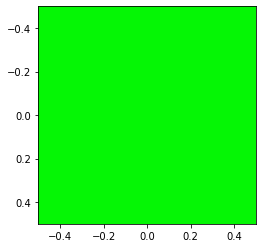

In [237]:
img = cv2.imread('../imgs/foreground.png')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
color = get_color(img)
print(color)
plt.imshow(color.reshape(1,1,3))  

## 2.2

In [238]:
def mergeImage(fg,bg):
    shape_fg = np.shape(fg)
    shape_bg = np.shape(bg)
    x = shape_bg[0] - shape_fg[0]
    y = shape_bg[1] - shape_fg[1] - 115
    sum = np.sum(fg,axis=2)
    val = np.divide(fg[:,:,1],sum)

    for i in range(shape_fg[0]):
        for j in range(shape_fg[1]):
            if( val[i][j] < 0.55):
                bg[x+i,y+j,:] = fg[i,j,:]
    return(bg)

True

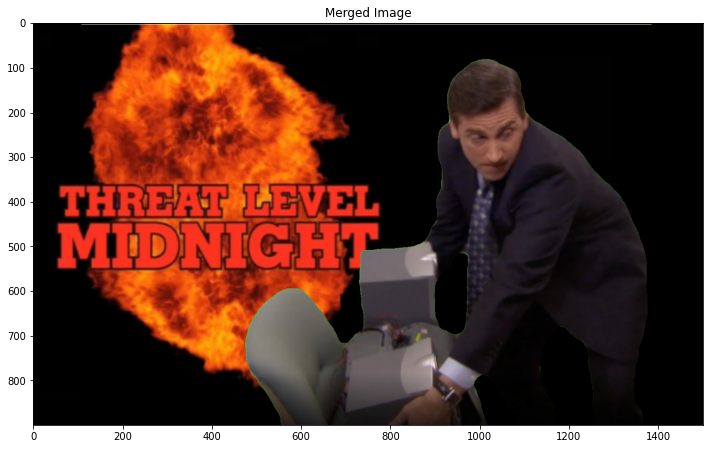

In [239]:
fg = cv2.imread('../imgs/foreground.png')
bg = cv2.imread('../imgs/background.png')
bg = cv2.cvtColor(bg,cv2.COLOR_BGR2RGB)
fg = cv2.cvtColor(fg,cv2.COLOR_BGR2RGB)
result = mergeImage(fg,bg)
plt.figure(figsize=(12,9))
plt.title("Merged Image")
plt.imshow(result)
result = cv2.cvtColor(result,cv2.COLOR_RGB2BGR)
cv2.imwrite('../imgs/result.png',result)

# Question 3

## 3.1

In [240]:
def piecewiseLinTransform(k1,k2,a,b,image):
    img = image.copy()
    output = np.zeros(np.shape(img))
    for j in range(np.size(k1)):
        where = np.where((img >= a[j]) & (img < b[j]))   # First get all the locations of the pixels whose intensities lie in the range of a part of the function
        output[where] = np.multiply(img[where],k1[j])       # Then We perform the linear transform to the specific locations
        output[where] = np.add(output[where],k2[j])               
    
    # This is iteraed for all the peices of the piecewise functon and the updated intensities are stored in a blank image
    return(output)

## 3.2

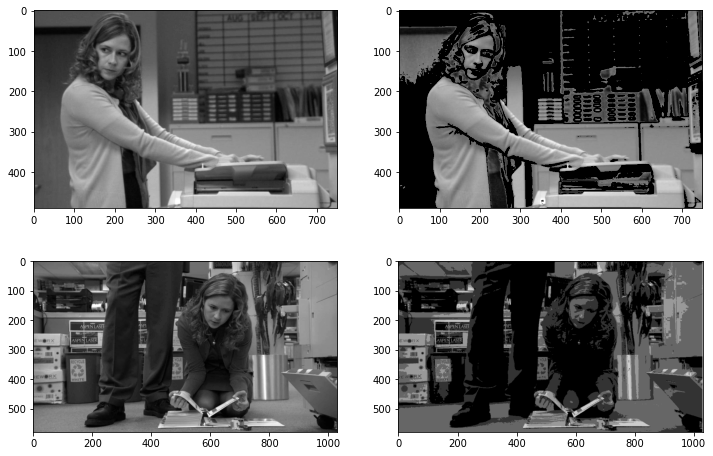

In [241]:
image = cv2.imread('../imgs/pam1.png')
image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
image2 = cv2.imread('../imgs/pam2.png')
image2 = cv2.cvtColor(image2,cv2.COLOR_BGR2GRAY)

func1_k1 = [2.5,-0.5,1]
func1_k2 = [0,0.6,-0.1]
func1_a = [0,51,102]
func1_b = [51,102,255]

func2_k1 = [0,0,0,0,0]
func2_k2 = [0,0.2,0.4,0.6,0.8]
func2_a = [0,0.2,0.4,0.6,0.8]
func2_b = [0.2,0.4,0.6,0.8,1]
func2_a = np.multiply(func2_a,255)
func2_b = np.multiply(func2_b,255)
func2_k1 = np.multiply(func2_k1,255)
func2_k2 = np.multiply(func2_k2,255)


result = piecewiseLinTransform(func1_k1,func1_k2,func1_a,func1_b,image)
result2 = piecewiseLinTransform(func2_k1,func2_k2,func2_a,func2_b,image2)

plt.figure(figsize=(12,8))
plt.subplot(221)
plt.imshow(image,cmap='gray',vmin=0,vmax=255)
plt.subplot(223)
plt.imshow(image2,cmap='gray',vmin=0,vmax=255)
plt.subplot(222)
plt.imshow(result,cmap='gray',vmin=0,vmax=255)
plt.subplot(224)
plt.imshow(result2,cmap='gray',vmin=0,vmax=255)

## 3.3

In [242]:
def function():         # This function generates a custom piecewise function.
    x = list(range(256))
    x = np.divide(x,255)
    def piecewise(x):
        if((x>=0) & (x<0.2)):
            return(3*x)
        elif((x>=0.2) & (x<0.6)):
            return(0.8-x)
        elif((x>=0.6) & (x<0.8)):
            return(3*x-1.6)
        elif((x>=0.8) & (x<1)):
            return(0.8)
        else:
            pass
    y=[]
    for i in range(256):
        y.append(piecewise(x[i]))
        
    return(x,y)

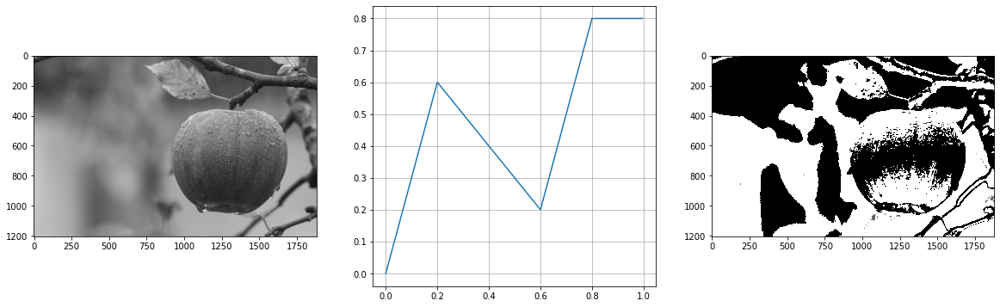

In [243]:
image = cv2.imread('../imgs/my_image.jpeg')
image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

func1_k1 = [3,-1,3,0]
func1_k2 = [0,0.8,-1.6,0.8]
func1_a = [0,0.2,0.6,0.8]
func1_b = [0.2,0.6,0.8,1]

func1_a = np.multiply(func1_a,255)
func1_b = np.multiply(func1_b,255)
func1_k1 = np.multiply(func1_k1,255)
func1_k2 = np.multiply(func1_k2,255)

(x,y) = function()
result = piecewiseLinTransform(func1_k1,func1_k2,func1_a,func1_b,image)

plt.figure(figsize=(20,6))
plt.subplot(131)
plt.imshow(image,cmap='gray',vmin=0,vmax=255)
plt.subplot(133)
plt.imshow(result,cmap='gray',vmin=0,vmax=255)
plt.subplot(132)
plt.plot(x,y)
plt.grid()

# Question 4

## 4.1

In [244]:
def gen_fun(plane):
    parts = pow(2,plane-1)
    k1 = np.zeros(int(256/parts))
    a = []
    b = []
    k2 = []
    for i in range(int(256/parts)):
        a.append(i*parts)
        b.append(parts*(i+1))
    for i in range(int(256/parts)):
        k2.append(i%2)
    
    k2 = np.multiply(k2,255)
    return(k1,k2,a,b)


def bitSlice(img_slice,plane):
    (k1,k2,a,b) = gen_fun(plane)
    return(piecewiseLinTransform(k1,k2,a,b,img_slice))

## 4.2

In [245]:
rupee_slice = cv2.imread("../imgs/rupee.jpg")
rupee_slice = cv2.cvtColor(rupee_slice,cv2.COLOR_BGR2GRAY)
pepper_slice = cv2.imread("../imgs/pepper.jpg")
pepper_slice = cv2.cvtColor(pepper_slice,cv2.COLOR_BGR2GRAY)
security_slice = cv2.imread("../imgs/securityThreat.jpg")
security_slice = cv2.cvtColor(security_slice,cv2.COLOR_BGR2GRAY)

rupee_out1 = bitSlice(rupee_slice,1)
rupee_out2 = bitSlice(rupee_slice,2)
rupee_out3 = bitSlice(rupee_slice,3)
rupee_out4 = bitSlice(rupee_slice,4)
rupee_out5 = bitSlice(rupee_slice,5)
rupee_out6 = bitSlice(rupee_slice,6)
rupee_out7 = bitSlice(rupee_slice,7)
rupee_out8 = bitSlice(rupee_slice,8)

pepper_out1 = bitSlice(pepper_slice,1)
pepper_out2 = bitSlice(pepper_slice,2)
pepper_out3 = bitSlice(pepper_slice,3)
pepper_out4 = bitSlice(pepper_slice,4)
pepper_out5 = bitSlice(pepper_slice,5)
pepper_out6 = bitSlice(pepper_slice,6)
pepper_out7 = bitSlice(pepper_slice,7)
pepper_out8 = bitSlice(pepper_slice,8)

security_out1 = bitSlice(security_slice,1)
security_out2 = bitSlice(security_slice,2)
security_out3 = bitSlice(security_slice,3)
security_out4 = bitSlice(security_slice,4)
security_out5 = bitSlice(security_slice,5)
security_out6 = bitSlice(security_slice,6)
security_out7 = bitSlice(security_slice,7)
security_out8 = bitSlice(security_slice,8)

In [246]:
rupee_out = [rupee_out1,rupee_out2,rupee_out3,rupee_out4,rupee_out5,rupee_out6,rupee_out7,rupee_out8]
i = 0
for items in rupee_out:
    i = i+1
print(i)

8


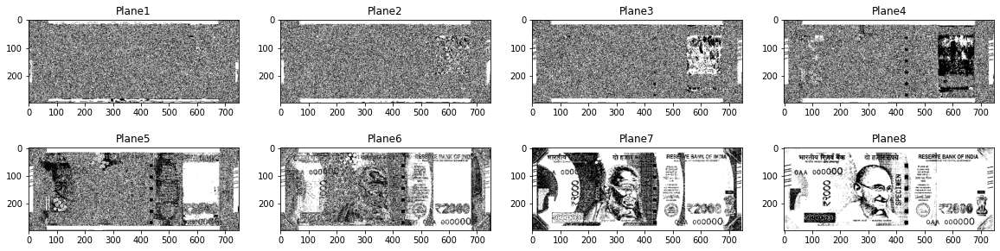

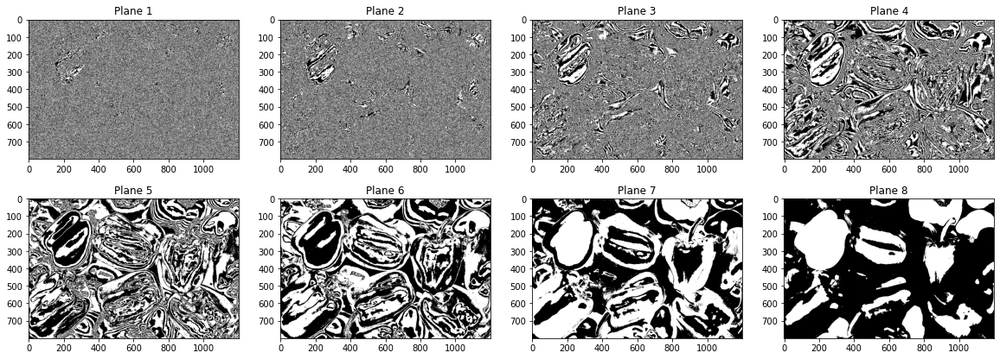

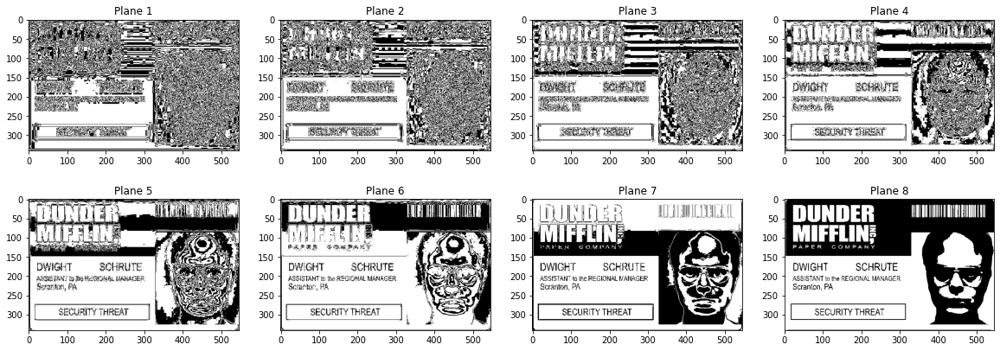

In [247]:
rupee_out = [rupee_out1,rupee_out2,rupee_out3,rupee_out4,rupee_out5,rupee_out6,rupee_out7,rupee_out8]
pepper_out = [pepper_out1,pepper_out2,pepper_out3,pepper_out4,pepper_out5,pepper_out6,pepper_out7,pepper_out8]
security_out = [security_out1,security_out2,security_out3,security_out4,security_out5,security_out6,security_out7,security_out8]


plt.figure(figsize=(20,5),num=1)
i = 1 
for item in rupee_out:
    plt.subplot(2,4,i)
    plt.imshow(item,cmap="gray")
    plt.title("Plane"+str(i))
    i=i+1

i = 1
plt.figure(figsize=(20,7),num=2)
for item in pepper_out:
    plt.subplot(2,4,i)
    plt.imshow(item,cmap="gray")
    plt.title("Plane "+str(i))
    i=1+i

i = 1
plt.figure(figsize=(20,7),num=3)
for item in security_out:
    plt.subplot(2,4,i)
    plt.imshow(item,cmap="gray")
    plt.title("Plane "+str(i))
    i = i+1

## 4.3

In [248]:
def imgbitQuantizer(image,s):
    output = np.zeros(np.shape(image))
    for i in range(s):
        sliced_output = bitSlice(image,8-i)
        adder = np.divide(sliced_output,255)
        mult = np.multiply(pow(2,7-i),adder)
        output = output + mult
    return output

## 4.4

In [249]:
rupee = cv2.imread("../imgs/rupee.jpg",0)
pepper = cv2.imread("../imgs/pepper.jpg",0)
security = cv2.imread("../imgs/securityThreat.jpg",0)

rupee5 = imgbitQuantizer(rupee,4)
rupee6 = imgbitQuantizer(rupee,3)
rupee7 = imgbitQuantizer(rupee,2)

pepper5 = imgbitQuantizer(pepper,4)
pepper6 = imgbitQuantizer(pepper,3)
pepper7 = imgbitQuantizer(pepper,2)

security5 = imgbitQuantizer(security,4)
security6 = imgbitQuantizer(security,3)
security7 = imgbitQuantizer(security,2)

Text(0.5, 1.0, 'First 4 bits')

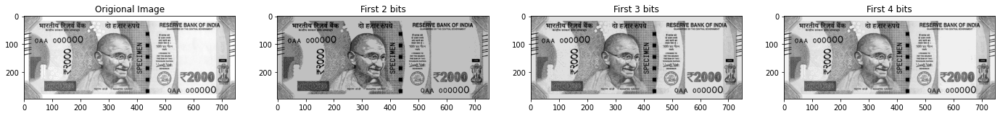

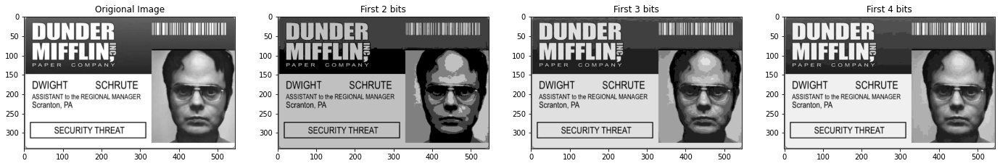

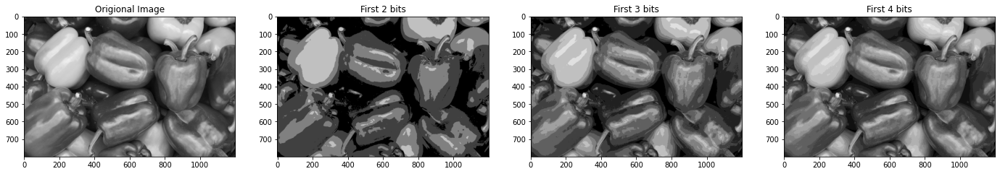

In [250]:
plt.figure(figsize=(24,16))
plt.subplot(141)
plt.imshow(rupee,cmap='gray',vmin=0,vmax=255)
plt.title("Origional Image")
plt.subplot(142)
plt.imshow(rupee7,cmap='gray',vmin=0,vmax=255)
plt.title("First 2 bits")
plt.subplot(143)
plt.imshow(rupee6,cmap='gray',vmin=0,vmax=255)
plt.title("First 3 bits")
plt.subplot(144)
plt.imshow(rupee5,cmap='gray',vmin=0,vmax=255)
plt.title("First 4 bits")

plt.figure(figsize=(24,16))
plt.subplot(141)
plt.imshow(security,cmap='gray',vmin=0,vmax=255)
plt.title("Origional Image")
plt.subplot(142)
plt.imshow(security7,cmap='gray',vmin=0,vmax=255)
plt.title("First 2 bits")
plt.subplot(143)
plt.imshow(security6,cmap='gray',vmin=0,vmax=255)
plt.title("First 3 bits")
plt.subplot(144)
plt.imshow(security5,cmap='gray',vmin=0,vmax=255)
plt.title("First 4 bits")

plt.figure(figsize=(24,16))
plt.subplot(141)
plt.imshow(pepper,cmap='gray',vmin=0,vmax=255)
plt.title("Origional Image")
plt.subplot(142)
plt.imshow(pepper7,cmap='gray',vmin=0,vmax=255)
plt.title("First 2 bits")
plt.subplot(143)
plt.imshow(pepper6,cmap='gray',vmin=0,vmax=255)
plt.title("First 3 bits")
plt.subplot(144)
plt.imshow(pepper5,cmap='gray',vmin=0,vmax=255)
plt.title("First 4 bits")


In **4.2** we observe that the major details of the image are stored in the *MSBs* (first 3-4 bits of an 8 bit image) and minute details are represented using the *LSBs* (last 4-5 bits of an 8 bit image).  
In **4.4** if combine the first *k* bits of an image, we observe that the image is more sharp and the smoothness of the image is reduces bucause the detials of the image are missing.   

## 4.5 (Bonus)
Bit plane slicing can be used for image compression. It ca also be used for sharpening the image and denoising the image to a certial level.

# Question 5

## 5.1
**(a)** Range of $\gamma$ is $\gamma>0$  
**(b)** If c = 1 the transformed pixel intensisy can be out of range of an  image from 0-255 to 0-1 and then take apply the power operation and modify c to 255 to de-normalize the intensities.  
**(c)** When $\gamma < 1$ the lower intensities of the image increased to brighten the image. When $\gamma = 1$ there is not change in the pixel intensities when C = 1 for an unnormalized image. For $\gamma > 1$ the higher intensities are lowered to reduce the brightness of the image. 

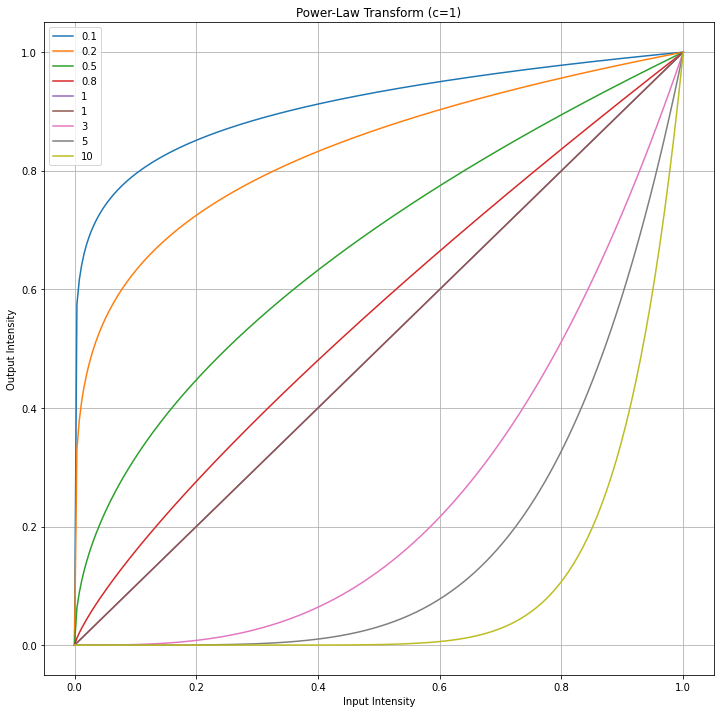

In [251]:
intensity = np.arange(256)
intensity = np.divide(intensity,255)
gamma = [0.1,0.2,0.5,0.8,1,1,3,5,10]
plt.figure(figsize=(12,12))
for k in gamma:
    output = np.power(intensity,k)
    plt.plot(intensity,output,label=k)

plt.legend()
plt.grid()
plt.xlabel("Input Intensity")    
plt.ylabel("Output Intensity")
plt.title("Power-Law Transform (c=1)")
plt.show()


## 5.2

In [252]:
def powerLawTransform(image, gamma):
    if gamma < 0:
        return 0
    img = image.copy()
    if gamma > 1:
        c = 255
        img = np.divide(img,255)
    if gamma <=1:
        c = pow(255,1-gamma)
    
    output = np.power(img,gamma)
    output = np.multiply(c,output)
    return output

## 5.3

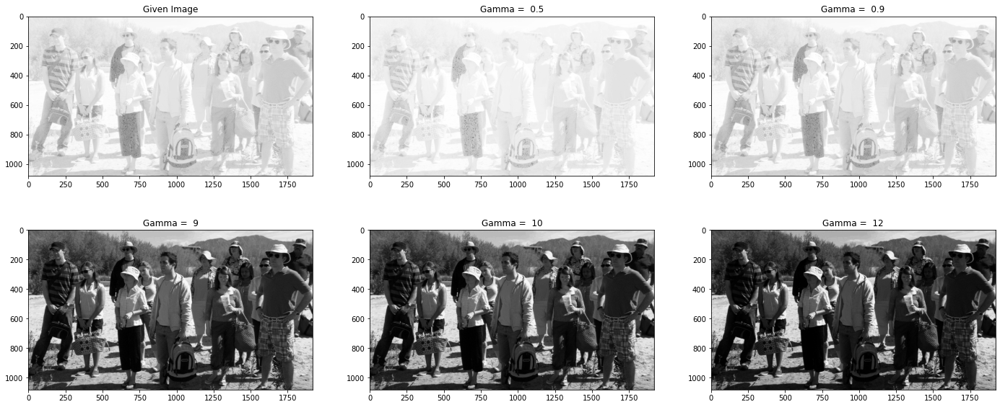

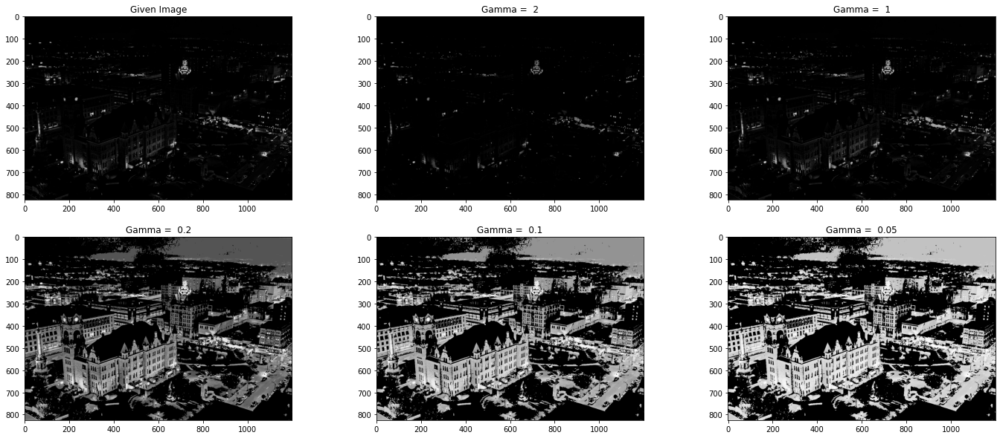

In [253]:
trip_group = cv2.imread("../imgs/tripGrpPhoto.png",0)
areal = cv2.imread("../imgs/scrantonAreal.png",0)
gamma_areal = [2,1,0.2,0.1,0.05]
gamma_trip = [0.5,0.9,9,10,12]

plt.figure(figsize=(24,10))
plt.subplot(231)
plt.imshow(trip_group,cmap='gray',vmin=0,vmax=255)
plt.title("Given Image")
i = 2

for gamma in gamma_trip:
    output_trip = powerLawTransform(trip_group,gamma)
    plt.subplot(2,3,i)
    plt.imshow(output_trip,cmap='gray',vmin=0,vmax=255)
    strs = " %s" %gamma
    plt.title('Gamma = '+strs)
    i = i+1

plt.figure(figsize=(24,10))
plt.subplot(231)
plt.imshow(areal,cmap='gray',vmin=0,vmax=255)
plt.title("Given Image")
i=2

for gamma in gamma_areal:
    output_areal = powerLawTransform(areal,gamma)
    plt.subplot(2,3,i)
    plt.imshow(output_areal,cmap='gray',vmin=0,vmax=255)
    strs = " %s" %gamma
    plt.title('Gamma = '+strs)
    i=i+1

From the above results we can observe that when $\gamma > 1$ the darker pixels of the image are getting the darker. But when $\gamma < 1$ the higher intensities are getting lower and the whitness of the image is reduces

## 5.4 

We can use *log* transform to enhance these images.  
This transform is given by  
$c\log_{2}^{(r+1)}$     
Here *c* is a constant and *r* is the input intensity.  

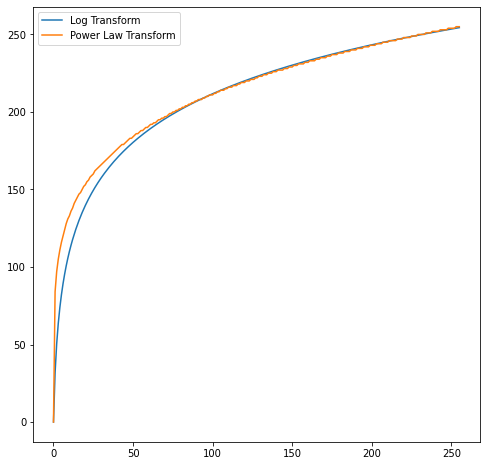

In [254]:
intent = np.arange(256)
output = np.log2(intent+1)
output = np.multiply(output,31.8)
output_powerlaw = np.round(pow(intent/255,0.2)*255)
plt.figure(figsize=(8,8))
plt.plot(intent,output,label="Log Transform")
plt.plot(intent,output_powerlaw,label='Power Law Transform')
plt.legend()

/tmp/ipykernel_12230/4246106196.py:6: RuntimeWarning: divide by zero encountered in log2
  output = np.log2(areal_cpy+1)


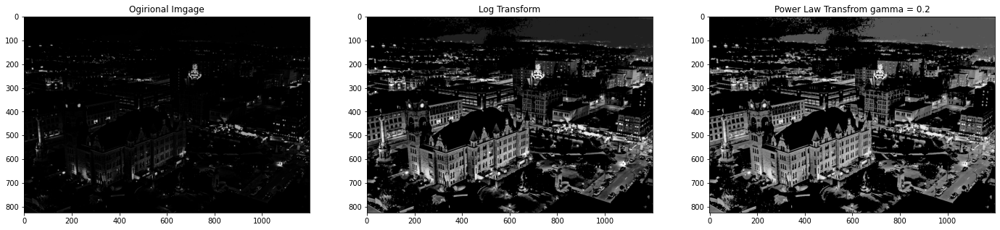

In [255]:
areal = cv2.imread("../imgs/scrantonAreal.png",0)

gamma_areal = 0.2
output_areal = powerLawTransform(areal,gamma_areal)
areal_cpy = areal.copy()
output = np.log2(areal_cpy+1)
output = np.round(np.multiply(31.8,output))

plt.figure(figsize=(24,14))
plt.subplot(131)
plt.imshow(areal,cmap='gray',vmin=0,vmax=255)
plt.title("Ogirional Imgage")
plt.subplot(132)
plt.imshow(output,cmap='gray',vmin=0,vmax=255)
plt.title("Log Transform")
plt.subplot(133)
plt.imshow(output_areal,cmap='gray',vmin=0,vmax=255)
plt.title("Power Law Transfrom gamma = 0.2")
plt.show()

# Question 6

### 1

<BarContainer object of 255 artists>

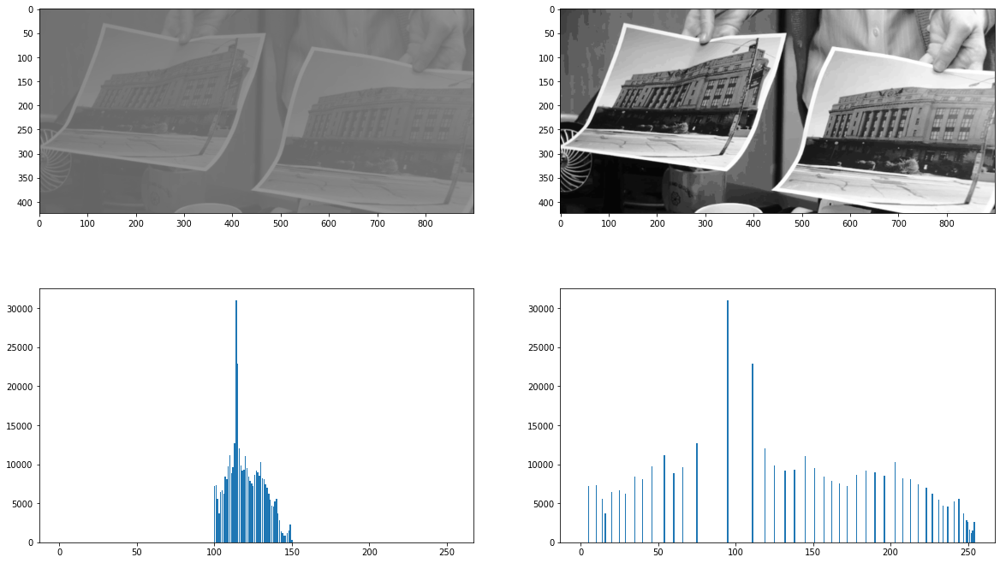

In [256]:
def hist_eql(image):
    img = image.copy()
    [x,y] = np.shape(img)
    output = np.zeros((x,y))
    unique,counts = np.unique(image,return_counts=True)     # Here we count the number of pixels for eah of the intensity 
    for i in range(256):
        where = np.where(unique <= i )                      # Then using the pdfs of the intensity we map each intensity 
        sum = np.sum(counts[where])/(x*y)                   # to the equalized intensity and replae the origional intensity 
        intent = round(255*sum)                             # with the modified intensity
        output[np.where(img == i)] = intent
    return output

image = cv2.imread('../imgs/Same_picture.png',0)

output = hist_eql(image)

plt.figure(figsize=(20,12))
plt.subplot(221)
plt.imshow(image,cmap="gray",vmin=0,vmax=255)
plt.subplot(222)
plt.imshow(output,cmap='gray',vmin=0,vmax=255)
plt.subplot(223)
histogram ,bin_edges= np.histogram(image,bins=255,range=(0,255))
plt.bar(bin_edges[0:-1], histogram)
plt.subplot(224)
histogram ,bin_edges= np.histogram(output,bins=255,range=(0,255))
plt.bar(bin_edges[0:-1], histogram)



## 2.a

In [257]:
def hist_match(input,ref):
    
    xr,yr = np.shape(ref)
    unique,counts = np.unique(ref,return_counts=True)
    inverse = {}
    s = []
    
    # First we find the equalization values from the reference image
    for i in range(256):
        where = np.where(unique <= i )
        sum = np.sum(counts[where])/(xr*yr) 
        intent = round(255*sum)
        s.append(intent)
    
    s = np.array(s)
    
    # After that there will be multiple mappings of the a single equalized value to origional intensities,
    # for this we take the minimum value of the mapped origional intensity,
    # also there will be values of intensities in range of 0-255 which dont map to any value of input intensity,
    # so for this the input intensity is mapped to the origional intensity of the closest equalized intensity
    # By doing this we get a inverse funtion of the reference image
    for i in range(256):
        where = np.where(s==i)
        
        if(len(where[0]) != 0):
            minm = min(where[0])
            inverse.update({str(i):minm})
        else:
            maxim = (np.abs(s-i)).argmin()
            inverse.update({str(i):maxim})
    
    # then generating a map we apply histogram equalization to the input image and map the value according the 
    # inverse function which we calculated above
    x,y = np.shape(input)
    output = np.zeros((x,y))
    unique,counts = np.unique(input,return_counts=True)
    for i in range(256):
        where = np.where(unique <= i )
        sum = np.sum(counts[where])/(x*y)
        intent = round(255*sum)
        intent = inverse[str(intent)]
        output[np.where(input == i)] = intent
    return output



<BarContainer object of 255 artists>

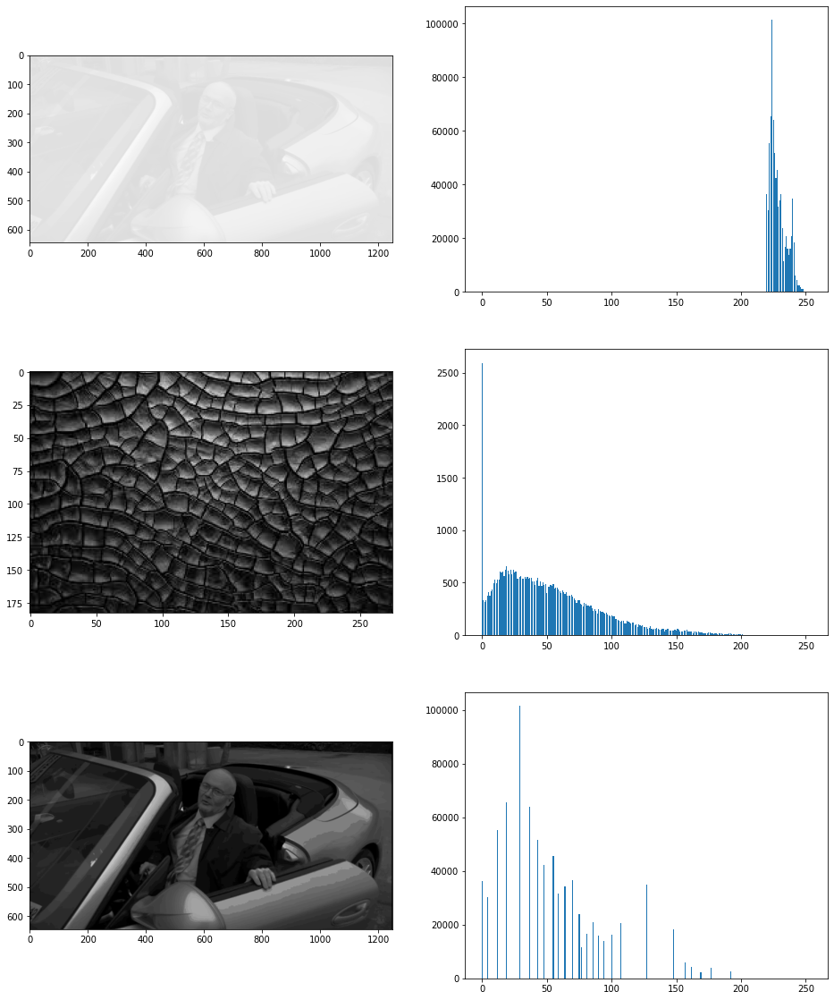

In [258]:
image = cv2.imread('../imgs/Creed.png',0)  
ref = cv2.imread('../imgs/Texture.jpg',0)
output = hist_match(image,ref)

plt.figure(figsize=(16,20))
plt.subplot(321)
plt.imshow(image,cmap='gray',vmin=0,vmax=255)
plt.subplot(323)
plt.imshow(ref,cmap='gray',vmin=0,vmax=255)
plt.subplot(325)
plt.imshow(output,cmap='gray',vmin=0,vmax=255)

plt.subplot(322)
histogram ,bin_edges= np.histogram(image,bins=255,range=(0,255))
plt.bar(bin_edges[0:-1], histogram)
plt.subplot(324)
histogram ,bin_edges= np.histogram(ref,bins=255,range=(0,255))
plt.bar(bin_edges[0:-1], histogram)
plt.subplot(326)
histogram ,bin_edges= np.histogram(output,bins=255,range=(0,255))
plt.bar(bin_edges[0:-1], histogram)

# Question 7

## 7.1.1


### (a)

In [259]:
def meanFilter(image,k):
    filter = np.ones((k,k))
    
    img = image.copy()
    kl = int((k-1)/2)
    [x,y] = np.shape(img)
    output = np.zeros(np.shape(image))
    
    img = np.pad(img,kl)
    
    for i in range(x):
        for j in range(y):
            output[i,j] = np.mean(img[i:i+k,j:j+k])
    output = np.round(output)
    return output

### (b)

In [260]:
def effmeanFilter(image,k):
    img = image.copy()
    [x,y] = np.shape(img)
    kl = int((k-1)/2)
    output = np.zeros(np.shape(image))
    
    img = np.pad(img,kl)
    
    for (i,j),val in np.ndenumerate(output):
        output[i,j] =  np.sum(img[i:i+k,j:j+k])
    
    output = np.round(np.divide(output,k*k))
    
    return output

### (c)

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


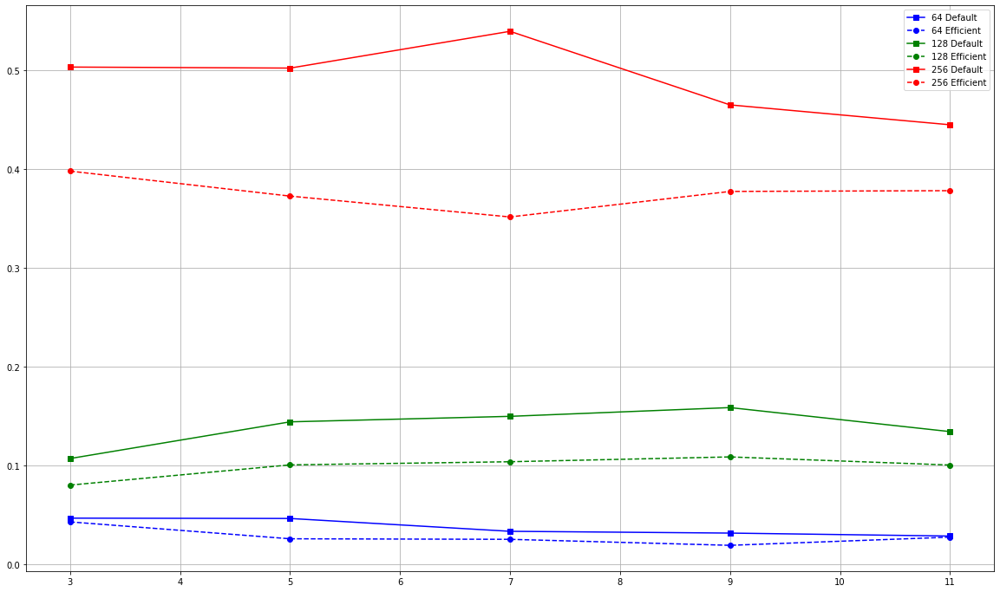

In [261]:
import time

image = cv2.imread('../imgs/testPattern.jpg',0)

image_size = [64,128,256]
k = [3,5,7,9,11]
col = ['b','g','r']
exec_time = []
exec_time_eff = []

i= 0
plt.figure(figsize=(20,12))
for size in image_size:
    for kl in k:
        st_time = time.time()
        output = meanFilter(image[0:size,0:size],kl)
        en_time = time.time()
        exec_time.append(en_time-st_time)

        st_time_eff = time.time()
        output_eff = effmeanFilter(image[0:size,0:size],kl)
        en_time_eff = time.time()
        exec_time_eff.append(en_time_eff-st_time_eff)
        print(np.array_equal(output,output_eff))
    plt.plot(k,exec_time,label=(str(size)+" Default"),color=col[i],marker='s')
    plt.plot(k,exec_time_eff,label=(str(size)+" Efficient"),linestyle='dashed',color= col[i],marker='o')
    i=i+1
    exec_time.clear() 
    exec_time_eff.clear()    
  

plt.legend()
plt.grid()
plt.show()

### (d)

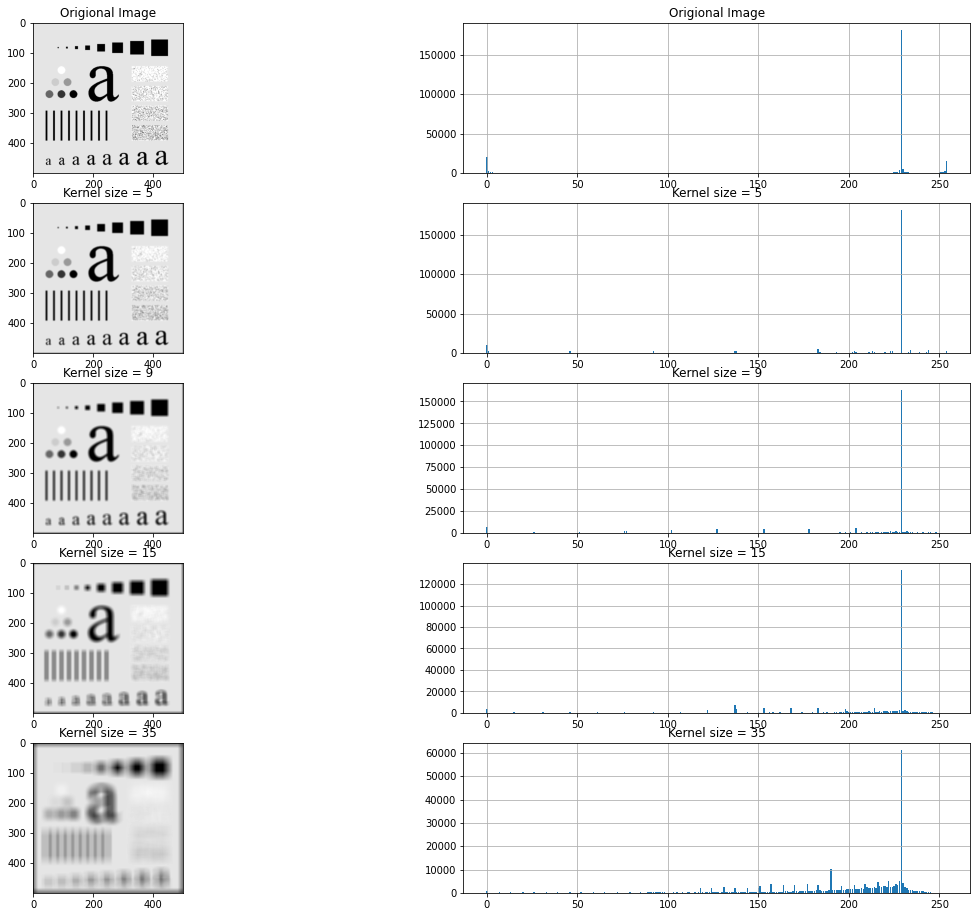

In [262]:
image = cv2.imread('../imgs/testPattern.jpg',0)
kernel = [5,9,15,35]
i = 3

plt.figure(figsize=(20,16))
plt.subplot(len(kernel)+1,2,1)
plt.imshow(image,cmap='gray',vmin=0,vmax=255)
plt.title("Origional Image")
plt.subplot(len(kernel)+1,2,2)
histogram ,bin_edges= np.histogram(image,bins=255,range=(0,255))
plt.bar(bin_edges[0:-1], histogram)
plt.title("Origional Image")
plt.grid(True)

for k in kernel:
    output = meanFilter(image,k)
    plt.subplot(len(kernel)+1,2,i)
    plt.imshow(output,cmap='gray',vmin=0,vmax=255)
    plt.title("Kernel size = "+str(k))
    plt.subplot(len(kernel)+1,2,i+1)
    histogram ,bin_edges= np.histogram(output,bins=255,range=(0,255))
    plt.bar(bin_edges[0:-1], histogram)
    plt.title("Kernel size = "+str(k))
    plt.grid(True)
    i = i+2


## 7.1.2

### 1.a)

For k = 1 standard deviation = 0.3989422804014327
For k = 2 standard deviation = 0.3989422804014327
For k = 3 standard deviation = 0.19947114020071635
For k = 4 standard deviation = 0.06649038006690546
For k = 5 standard deviation = 0.06649038006690546
For k = 6 standard deviation = 0.01329807601338109
For k = 7 standard deviation = 0.019947114020071637
For k = 8 standard deviation = 0.002849587717153091
For k = 9 standard deviation = 0.005699175434306182



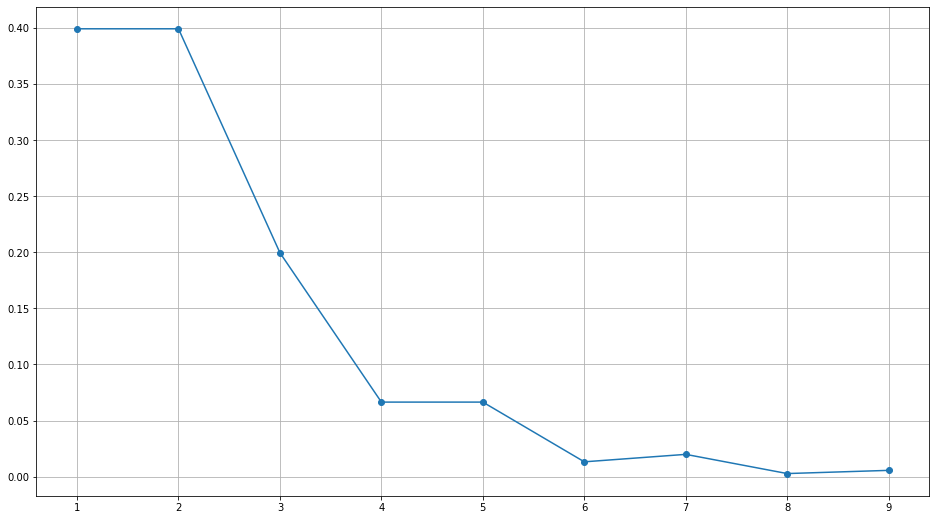

In [263]:
import math
def approx1DGaussFilter1(k):
    gauss = []
    dev = (np.math.factorial(int((k-1)/2))*np.math.factorial(int((k-1)/2)))/((np.math.factorial(k-1)*math.sqrt(2*math.pi)))
    for i in range(k):
        temp = np.math.factorial(k-1)/(np.math.factorial(k-1-i)*np.math.factorial(i))
        gauss.append(temp)
    return (gauss,dev)


devs = []
for k in range(1,10):
    [gauss,dev] = approx1DGaussFilter1(k)
    devs.append(dev)
    print("For k = "+str(k)+" standard deviation =",str(dev))
print()
plt.figure(figsize=(16,9))
plt.plot(range(1,10),devs,marker='o')
plt.grid(True)
plt.show()


### 1.b)

In [264]:
def approx1DGaussFilter2(sigma, dev):
    k = math.ceil(sigma*dev)
    [gauss,dev] = approx1DGaussFilter1(k)
    return (gauss,k)
x = [3,5,7]
cov = [86.64,98.76,99.95]
for i in range(3):
    [gauss,k] = approx1DGaussFilter2(x[i],1.4)
    print("For "+str(cov[i])+"% k = "+str(k))


For 86.64% k = 5
For 98.76% k = 7
For 99.95% k = 10


### 2.a)


In [265]:
def gaussKernelGenerator(k , var):
    kernel = np.zeros((k,k))
    kl = math.floor(k/2)
    for i in range(k):
        for j in range(k):
            kernel[i,j] = math.exp(-(pow((i-kl),2) + pow((j-kl),2))/(2*pow(var,2)))
    const = np.sum(kernel)
    kernel = np.divide(kernel,const)
    return kernel

k = 3
var = 1.5
kernel = gaussKernelGenerator(k,var)
print(kernel)

[[0.09474166 0.11831801 0.09474166]
 [0.11831801 0.14776132 0.11831801]
 [0.09474166 0.11831801 0.09474166]]


### 2.b)

In [266]:
def approx2DGaussFilter(dev):
    k = math.ceil(5*dev)
    [gauss, dev] = approx1DGaussFilter1(k)
    
    gauss = np.divide(gauss,pow(2,len(gauss)-1))
    gauss = np.matrix(gauss)
    kernel = gauss.transpose()
    kernel = np.multiply(kernel,gauss)
    kernel = np.array(kernel)
    return kernel

kernel = approx2DGaussFilter(1.3)
print(kernel)

[[0.00024414 0.00146484 0.00366211 0.00488281 0.00366211 0.00146484
  0.00024414]
 [0.00146484 0.00878906 0.02197266 0.02929688 0.02197266 0.00878906
  0.00146484]
 [0.00366211 0.02197266 0.05493164 0.07324219 0.05493164 0.02197266
  0.00366211]
 [0.00488281 0.02929688 0.07324219 0.09765625 0.07324219 0.02929688
  0.00488281]
 [0.00366211 0.02197266 0.05493164 0.07324219 0.05493164 0.02197266
  0.00366211]
 [0.00146484 0.00878906 0.02197266 0.02929688 0.02197266 0.00878906
  0.00146484]
 [0.00024414 0.00146484 0.00366211 0.00488281 0.00366211 0.00146484
  0.00024414]]


### 2.c)

In [267]:
def multiply_kernel(kernel,image):
    a,b = np.shape(kernel)
    kernel = kernel.reshape(a*b)
    image = image.reshape(a*b)

    output = np.dot(kernel,image)
    
    kernel = kernel.reshape(a,b)
    image = image.reshape(a,b)
    return output

In [268]:
def gaussianFilter(image,var,k):
    kernel = gaussKernelGenerator(k,var)
    
    img = image.copy()
    [x,y] = np.shape(img)

    output = np.zeros(np.shape(img))
    
    img = np.pad(img,math.floor(k/2))
    
    for i in range(x):
        for j in range(y):
            output[i,j] = multiply_kernel(kernel,img[i:i+k,j:j+k])
    output = (np.round(output)).astype(int)
    return output

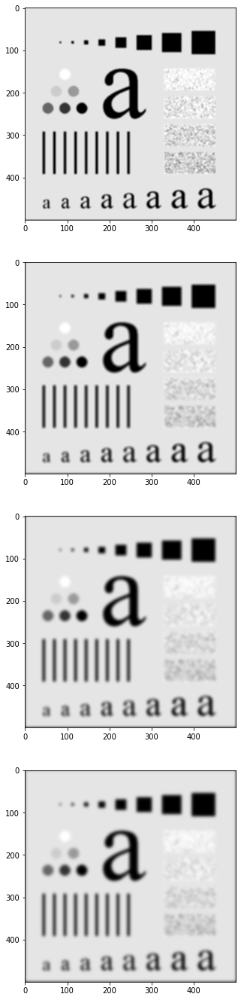

In [269]:
image = cv2.imread('../imgs/testPattern.jpg',0)
size = [5,9,15,35]
plt.figure(figsize=(25,30))
plt.subplot(511)
plt.imshow(image,cmap='gray',vmin=0,vmax=255)

for i in range(1,5):
    result = gaussianFilter(image,3.5,size[i-1])
    plt.subplot(5,1,i)
    plt.imshow(result,cmap='gray',vmin=0,vmax=255)

If we compare it from outputs of *7.1.1.4* the images are less smugged. And if we increase ***sigma*** the filter acts more like simple box filter.


## 7.2

### 1

In [270]:
def denoise(image,filter):
    k = 3
    img = image.copy()
    # k = int((k-1)/2)
    [x,y] = np.shape(img)
    output = np.zeros(np.shape(image))
    
    img = np.pad(img,k)
    
    if(filter == 1):
        for i in range(x):
            for j in range(y):
                output[i,j] = np.min(np.array(img[i:i+k,j:j+k]))

    
    if(filter == 2):
        for i in range(x):
            for j in range(y):
                output[i,j] = np.median(np.array(img[i:i+k,j:j+k]))
    
    if(filter == 3):
        for i in range(x):
            for j in range(y):
                output[i,j] = np.max(np.array(img[i:i+k,j:j+k]))
    
    
    return output

Text(0.5, 1.0, 'Median Filter')

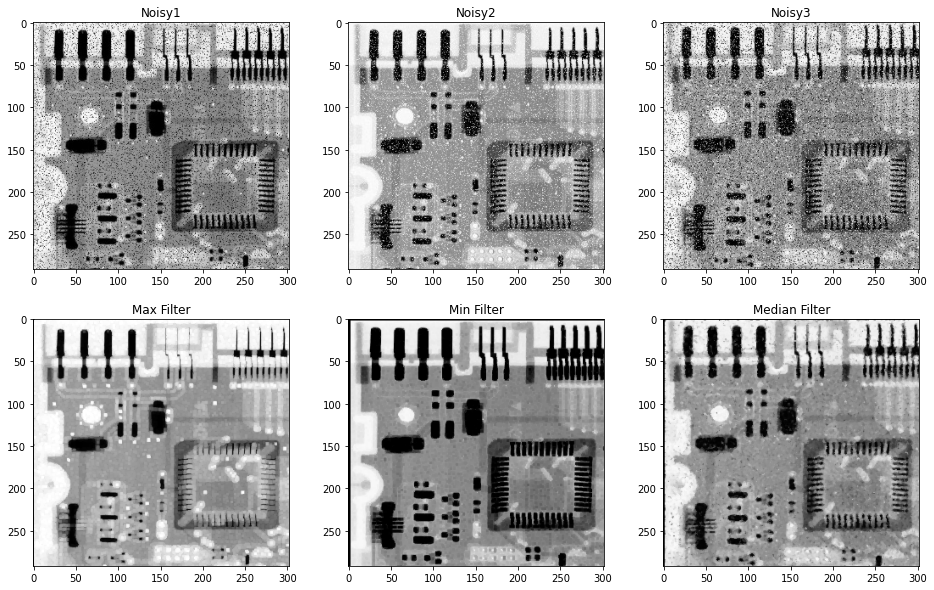

In [271]:
image1 = cv2.imread('../imgs/noisy1.jpeg',0)
image2 = cv2.imread('../imgs/noisy2.jpeg',0)
image3 = cv2.imread('../imgs/noisy3.jpeg',0)

output1 = denoise(image1,3)
output2 = denoise(image2,1)
output3 = denoise(image3,2)


plt.figure(figsize = (16,10))

plt.subplot(231)
plt.imshow(image1,cmap='gray',vmin=0,vmax=255)
plt.title("Noisy1")
plt.subplot(234)
plt.imshow(output1,cmap='gray',vmin=0,vmax=255)
plt.title("Max Filter")

plt.subplot(232)
plt.imshow(image2,cmap='gray',vmin=0,vmax=255)
plt.title("Noisy2")
plt.subplot(235)
plt.imshow(output2,cmap='gray',vmin=0,vmax=255)
plt.title("Min Filter")

plt.subplot(233)
plt.imshow(image3,cmap='gray',vmin=0,vmax=255)
plt.title("Noisy3")
plt.subplot(236)
plt.imshow(output3,cmap='gray',vmin=0,vmax=255)
plt.title("Median Filter")


For *noisy1* we use ***Max*** filter because its salt-pepper noise has more black pixels.  
For *noisy2* we use ***Min*** filter because its salt-pepper noise has more white pixels.  
For *noisy3* we use ***Median*** filter because its salt-pepper noise has both black and white pixels.  


### 2

In [272]:
def effMedianFilter(image,k):
    img = image.copy()
    [x,y] = np.shape(img)
    kl = int((k-1)/2)
    output = np.zeros(np.shape(image))
    
    img = np.pad(img,kl)
    
  
    for (i,j),val in np.ndenumerate(output):
        output[i,j] =  np.mean(img[i:i+k,j:j+k])
    
    return output

Text(0.5, 1.0, 'Median Filter')

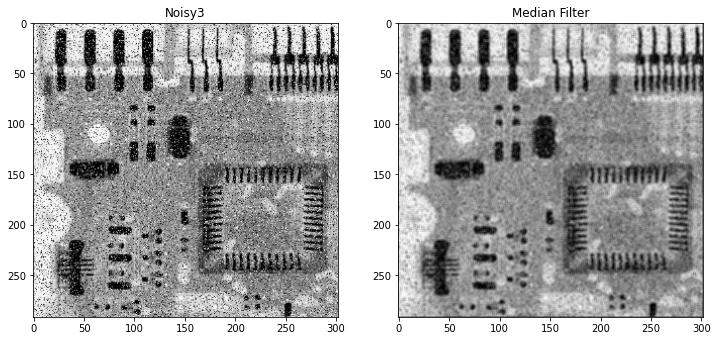

In [273]:
output = effMedianFilter(image3,3)
plt.figure(figsize = (12,8))
plt.subplot(121)
plt.imshow(image3,cmap='gray',vmin=0,vmax=255)
plt.title("Noisy3")
plt.subplot(122)
plt.imshow(output,cmap='gray',vmin=0,vmax=255)
plt.title("Median Filter")


## 7.3

### 1

In [274]:
def edge_detection(kernelx,kernely,image):
    img = image.copy()
    [x,y] = np.shape(img)
    output = np.zeros(np.shape(img))
    k,k1 = np.shape(kernelx)
    
    img = np.pad(img,math.floor(k/2))
    
    for (i,j),val in np.ndenumerate(output):
        output[i,j] = math.sqrt(pow(multiply_kernel(kernelx,img[i:i+k,j:j+k]),2)+ pow(multiply_kernel(kernely,img[i:i+k,j:j+k]),2))
    
    output = (np.round(output)).astype(int)
    return output
    
image = cv2.imread('../imgs/office.jpg',0)
# prewitt
kernelx = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
kernely = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
output_prewitt = edge_detection(kernelx,kernely,image)


# sobel
kernelx = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
kernely = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])
output_sobel = edge_detection(kernelx,kernely,image)

# laplacian 1
kernelx = np.array([[0,1,0],[1,-4,1],[0,1,0]])
kernely = np.array([[0,0,0],[0,0,0],[0,0,0]])
output_lap1 = edge_detection(kernelx,kernely,image)

# laplacian 2
kernelx = np.array([[1,1,1],[1,-8,1],[1,1,1]])
kernely = np.array([[0,0,0],[0,0,0],[0,0,0]])
output_lap2 = edge_detection(kernelx,kernely,image)




Text(0.5, 1.0, 'Laplacian Filter with diagonals')

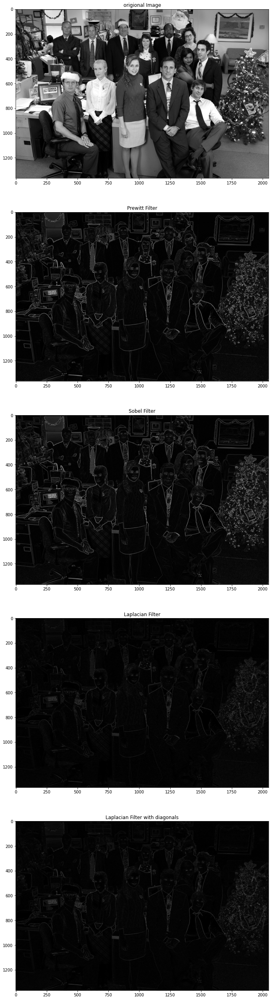

In [275]:

plt.figure(figsize=(20,45))
plt.subplot(511)
plt.imshow(image,cmap='gray',vmin=0,vmax=255)
plt.title("origional Image")
plt.subplot(512)
plt.imshow(output_prewitt,cmap='gray')
plt.title("Prewitt Filter")
plt.subplot(513)
plt.imshow(output_sobel,cmap='gray')
plt.title("Sobel Filter")
plt.subplot(514)
plt.imshow(output_lap1,cmap='gray')
plt.title("Laplacian Filter")
plt.subplot(515)
plt.imshow(output_lap2,cmap='gray')
plt.title("Laplacian Filter with diagonals")


### 2

A $5*5$ **Prewitt** filter will look like 
 
$M_x = $ $\begin{bmatrix} -2 & -1 & 0 & 1 & 2 \\ -2 & -1 & 0 & 1 & 2 \\ -2 & -1 & 0 & 1 & 2 \\ -2 & -1 & 0 & 1 & 2 \\ -2 & -1 & 0 & 1 & 2    \end{bmatrix}$ $M_y = $ $\begin{bmatrix}   2&2&2&2&2 \\ 1&1&1&1&1 \\ 0&0&0&0&0 \\ -1&-1&-1&-1&-1 \\ -2&-2&-2&-2&-2 \end{bmatrix}$

A $5*5$ **Sobel** filter will look like 
 
$M_x = $ $\begin{bmatrix} -2 & -1 & 0 & 1 & 2 \\ -8 & -4 & 0 & 4 & 8 \\ -12 & -6 & 0 & 6 & 12 \\ -8 & -4 & 0 & 4 & 8 \\ -2 & -1 & 0 & 1 & 2    \end{bmatrix}$ $M_y = $ $\begin{bmatrix}   2&8&12&8&2 \\ 1&4&6&4&1 \\ 0&0&0&0&0 \\ -1&-4&-1&-1&-1 \\ -2&-8&-12&-8&-2 \end{bmatrix}$

We get this sobel by multiplying  
$M_x = $ $\begin{bmatrix} -2 &-1&0&1&2\end{bmatrix}*\begin{bmatrix} 1\\4\\6\\4\\1\end{bmatrix}$

And $M_y$ by multipling the transpose of them.

In [276]:
# prewitt 5
kernelx = np.array([[-2,-1,0,1,2],[-2,-1,0,1,2],[-2,-1,0,1,2],[-2,-1,0,1,2],[-2,-1,0,1,2]])
kernely = np.array([[2,2,2,2,2],[1,1,1,1,1],[0,0,0,0,0],[-1,-1,-1,-1,-1],[-2,-2,-2,-2,-2]])
output_prewitt5 = edge_detection(kernelx,kernely,image)
kernelx = np.array([[-2,-1,0,1,2],[-8,-4,0,4,8],[-12,-6,0,6,12],[-8,-4,0,4,8],[-2,-1,0,1,2]])
kernely = np.array([[2,8,12,8,2],[1,4,6,4,1],[0,0,0,0,0],[-1,-4,-6,-4,-1],[-2,-8,-12,-8,-2]])
output_sobel5 = edge_detection(kernelx,kernely,image)

Text(0.5, 1.0, '5*5 Sobel Filter')

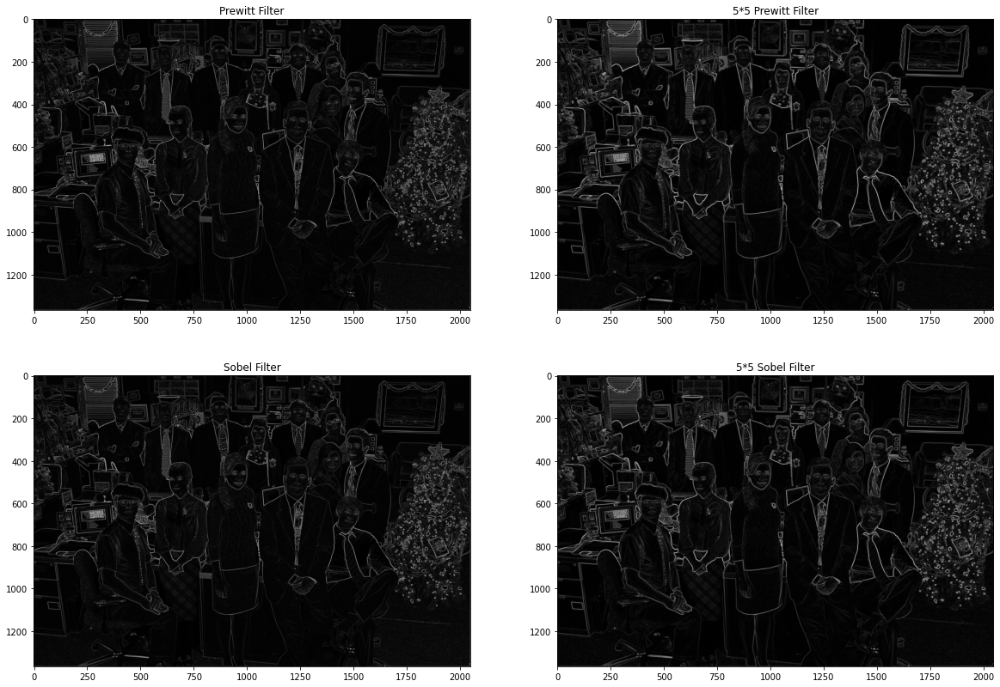

In [277]:
plt.figure(figsize=(20,14))
plt.subplot(221)
plt.imshow(output_prewitt,cmap='gray')
plt.title("Prewitt Filter")
plt.subplot(222)
plt.imshow(output_prewitt5,cmap='gray')
plt.title('5*5 Prewitt Filter')
plt.subplot(223)
plt.imshow(output_sobel,cmap='gray')
plt.title('Sobel Filter')
plt.subplot(224)
plt.imshow(output_sobel5,cmap='gray')
plt.title('5*5 Sobel Filter')


# Question 8

In [278]:
galaxy = cv2.imread('../imgs/galaxies.jpeg',0)

output_s = effmeanFilter(galaxy,15)
output_m = denoise(output_s,3)
pk1=[0,0]
k2 = [20,255]
a = [0,160]
b = [160,255]
output_r = piecewiseLinTransform(k1,k2,a,b,output_m)
output = denoise(output_r,3)

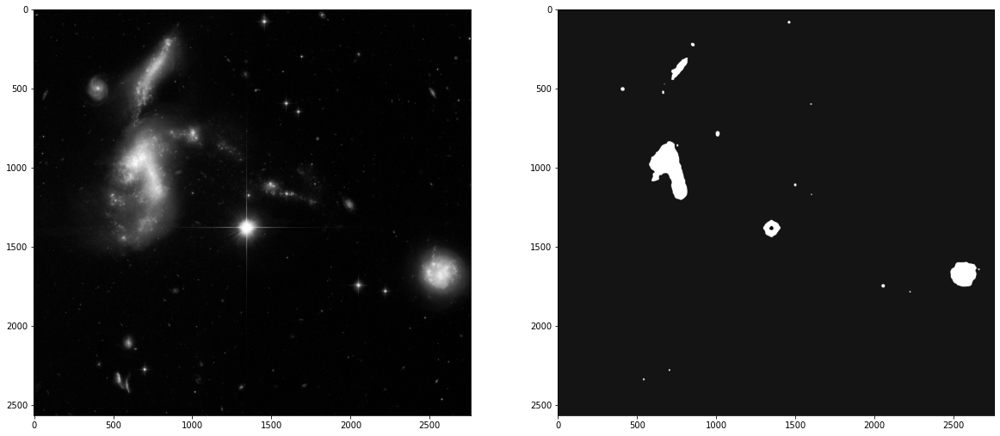

In [279]:
plt.figure(figsize=(20,16))
plt.subplot(121)
plt.imshow(galaxy,cmap='gray')
plt.subplot(122)
plt.imshow(output,cmap='gray')

Here first we apply ***Mean Filter*** to the image to remove all the small stars. Then we apply ***Max Filter*** tu further remove moise and enhance the edges. Once this if done we use ***Thresholding*** to differentiate between galaxy and the background. After this we use ***Max Filter*** just to make sure that all the starts are removed.